In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import glob
import cv2
import pickle

%matplotlib inline
plt.rcParams['figure.figsize'] = (8, 8)
plt.rcParams['image.interpolation'] = 'nearest'

### SegLink Model

In [34]:
from sl_model import SL512, DSODSL512
from sl_utils import PriorUtil
from ssd_data import InputGenerator
from ssd_data import preprocess
from ssd_utils import load_weights

#model = SL512()
model = DSODSL512()
image_size = model.image_size

prior_util = PriorUtil(model)
weights_path = './checkpoints/201710242216_sl512_synthtext/weights.002.h5'
#weights_path = './checkpoints/201710242216_sl512_synthtext/weights.003.h5'
weights_path = './checkpoints/201711111814_sl512_synthtext_focal/weights.001.h5'
#weights_path = './checkpoints/201711132011_dsodsl512_synthtext/weights.001.128812.h5'
weights_path = './checkpoints/201711132011_dsodsl512_synthtext/weights.001.h5'
load_weights(model, weights_path)

### CRNN Model

In [35]:
from crnn_model import CRNN
from crnn_utils import alphabet87 as alphabet

input_width = 256
input_height = 32

crnn_model = CRNN((input_width, input_height, 1), len(alphabet), prediction_only=True)

load_weights(crnn_model, './models/crnn_synthtext140k.hdf5')

layer missing in model the_input
layer missing in model the_labels
layer missing in model input_length
layer missing in model label_length
layer missing in model ctc


### Detection

In [36]:
inputs = []
images = []
images_orig = []
data = []

for img_path in glob.glob('data/images/test_images_seglink/*'):
    
    img = cv2.imread(img_path)
    
    images_orig.append(np.copy(img))
    
    inputs.append(preprocess(img, image_size))
    
    h, w = image_size
    img = cv2.resize(img, (w,h), cv2.INTER_LINEAR).astype('float32') # should we do resizing
    img = img[:, :, (2,1,0)] # BGR to RGB
    img /= 255
    images.append(img)
    
inputs = np.asarray(inputs)

preds = model.predict(inputs, batch_size=1, verbose=1)

25/25 [==============================] - 1s     


### Predict SynthText

In [37]:
import pickle
from data_synthtext import GTUtility

file_name = 'gt_util_synthtext_seglink.pkl'
with open(file_name, 'rb') as f:
    gt_util = pickle.load(f)
gt_util_train, gt_util_val = gt_util.split(gt_util, split=0.9)

In [38]:
inputs = []
images = []
images_orig = []
data = []

gtu = gt_util_train
gtu = gt_util_val

np.random.seed(1337)

for i in np.random.randint(0, gtu.num_samples, 16):

    img_path = os.path.join(gtu.image_path, gtu.image_names[i])
    img = cv2.imread(img_path)
    
    images_orig.append(np.copy(img))
    
    inputs.append(preprocess(img, image_size))
    
    h, w = image_size
    img = cv2.resize(img, (w,h), cv2.INTER_LINEAR).astype('float32') # should we do resizing
    img = img[:, :, (2,1,0)] # BGR to RGB
    img /= 255
    images.append(img)
    
    boxes = gtu.data[i]
    data.append(boxes)
    
inputs = np.asarray(inputs)

preds = model.predict(inputs, batch_size=1, verbose=1)

16/16 [==============================] - 0s     


### Recognition

words (19, 256, 32, 1)
rboxes 19 words 19 res_crnn 19
Leen                 L_____________e_______e________n______________________________
and                  a____________n_______d________________________________________
clip                 c__lli_p______________________________________________________
30,                  3___0___,_____________________________________________________
the                  t__________h________e_________________________________________
balls                b______a_____l___l__ss________________________________________
DOwn                 D_____________O__________w__________n_________________________
the                  t______h_______e______________________________________________
hit                  h____ii_tt____________________________________________________
for                  f___o_r_______________________________________________________
(you                 (__y__o__u____________________________________________________
(and                 (

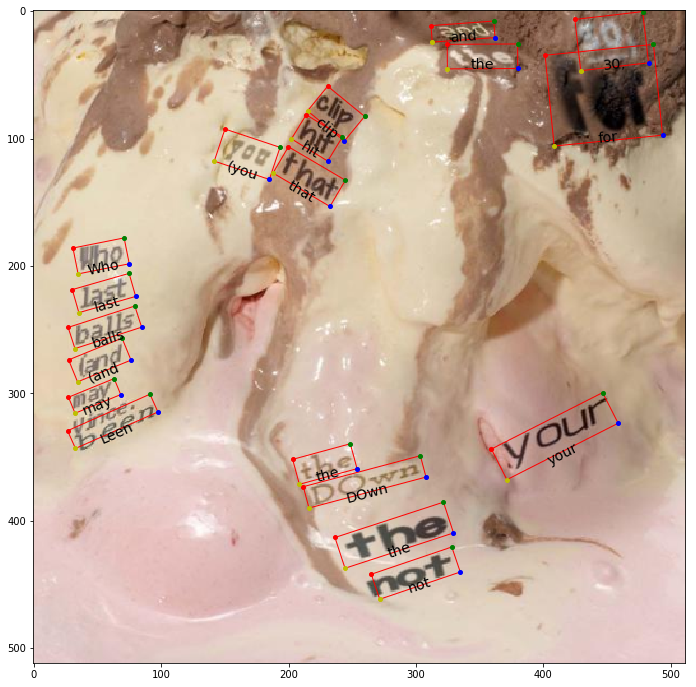

words (7, 256, 32, 1)
rboxes 7 words 7 res_crnn 7
data                 d_________a_____t____a________________________________________
tae                  t_____a_______e_______________________________________________
FBI                  F_____B____I__________________________________________________
the                  t___h____e____________________________________________________
that                 t___h__a____t_________________________________________________
and                  aa____n___d___________________________________________________
The                  T_____h____e__________________________________________________


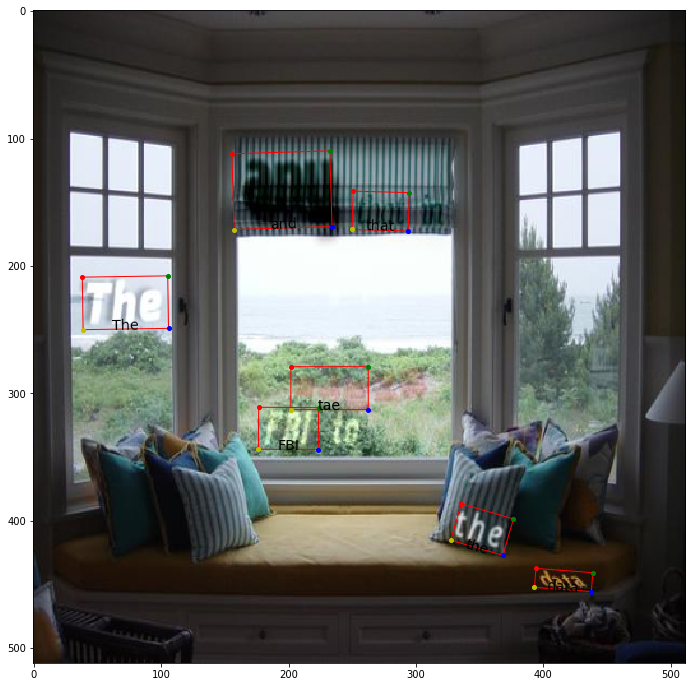

words (11, 256, 32, 1)
rboxes 11 words 11 res_crnn 11
remote               rree_m___o_tt_e_______________________________________________
but                  b___u___t_____________________________________________________
muptect              m__u_p__t__e_c__t_____________________________________________
sizes*               s___iiz___e__s__*_____________________________________________
reports.             rr___e__p___o__r_t__s________________________________________.
of                   o_________f___________________________________________________
coors                c______o_____o_____r_____s____________________________________
are                  a________r______e_____________________________________________
execution            ee_x__e_cc_u_ttiio__n_________________________________________
(ite                 (__i__t___e___________________________________________________
Fiethe               F__i__e___tt_hh___e___________________________________________


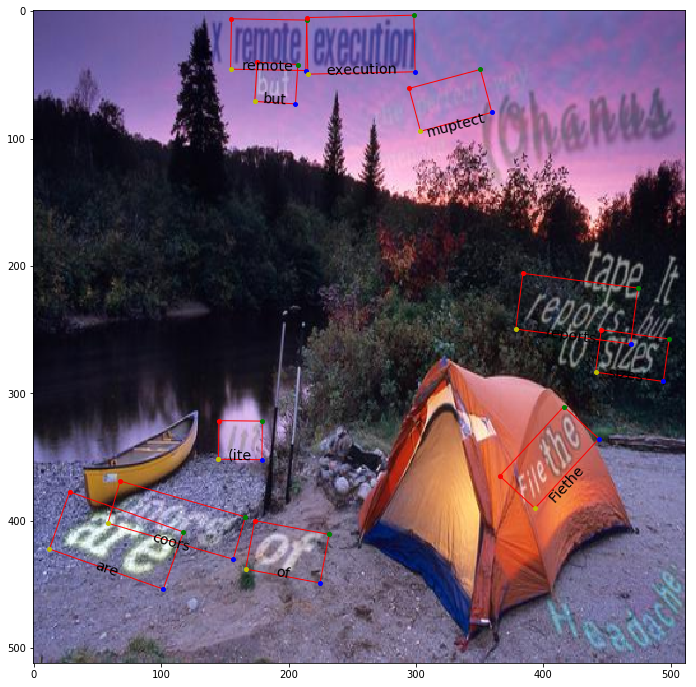

words (17, 256, 32, 1)
rboxes 17 words 17 res_crnn 17
be                   b___________e_________________________________________________
grant,               g___________r_____a_________n_________t______________________,
areas                a_______________r_______e________a___________s________________
medefect             m__________e_____d_________e______f_________e_____c______t____
batile               bb____a__tt_i_lee_____________________________________________
entitled             e________n_______t___i____t___l__e_____d______________________
prpmised             p____r____p___m______iiss__e___d______________________________
Law                  L_________a_________w_________________________________________
that                 tt_____h______a________t______________________________________
public               p______u_____bb____lii_c______________________________________
the                  t_h___eee_____________________________________________________
to                   t

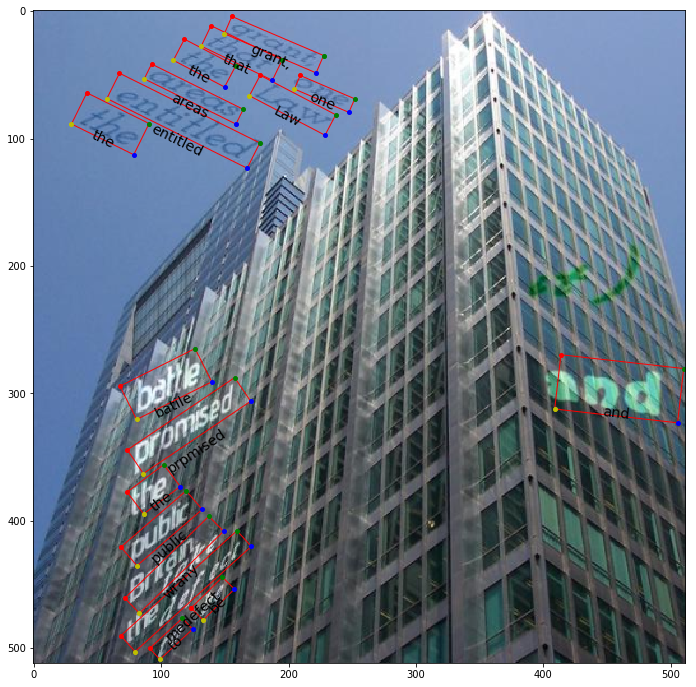

words (2, 256, 32, 1)
rboxes 2 words 2 res_crnn 2
tot                  t_____o____t__________________________________________________
>>aohs               >_>aa_o_h__s__________________________________________________


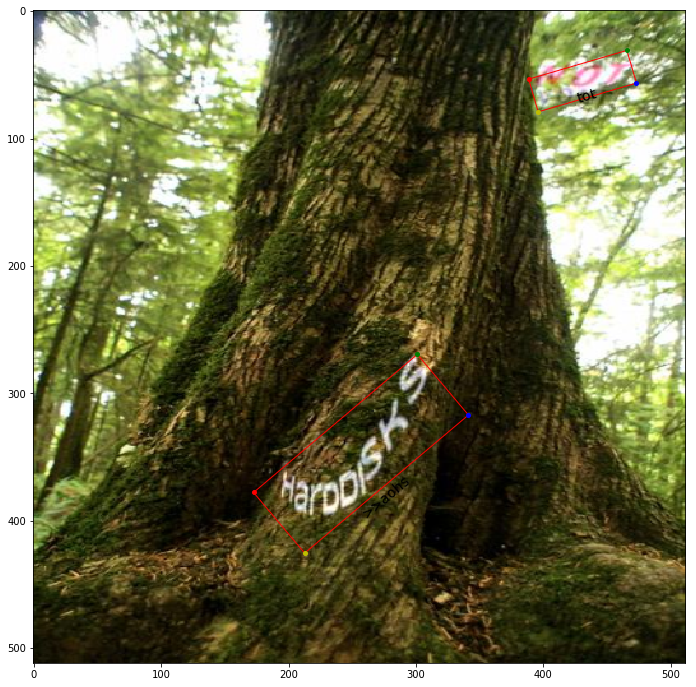

words (8, 256, 32, 1)
rboxes 8 words 8 res_crnn 8
pay                  p______a_____y________________________________________________
1st                  1__________s________________t_________________________________
the                  t___h____e____________________________________________________
the                  t________h______e_____________________________________________
the                  tt___h_____e__________________________________________________
IBD                  I__B_____D____________________________________________________
me                   m___________e_________________________________________________
Phiil                P_______h____i_______i_____l__________________________________


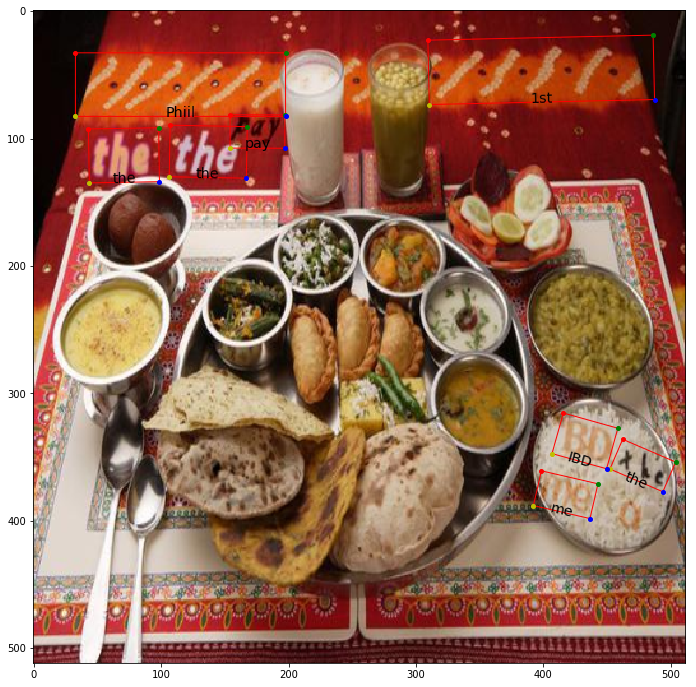

words (7, 256, 32, 1)
rboxes 7 words 7 res_crnn 7
The                  T____h____e___________________________________________________
the                  t____h______e_________________________________________________
one                  o_______n______e______________________________________________
time                 t___iii_m_______e_____________________________________________
arat                 a______r________a__________t__________________________________
ryp                  r___y__p______________________________________________________
paln,                p____a_l__n__________________________________________________,


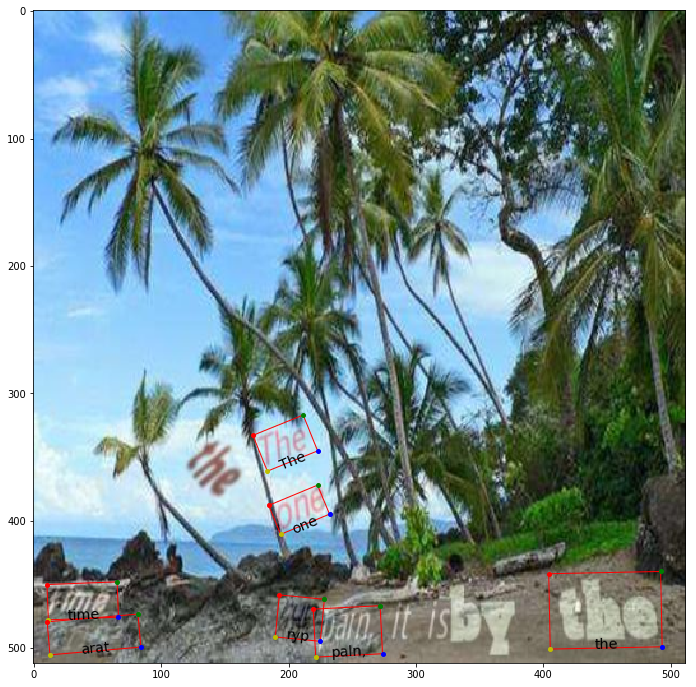

words (7, 256, 32, 1)
rboxes 7 words 7 res_crnn 7
mec                  m________e_____c______________________________________________
se                   s________________e____________________________________________
mes                  m_________________________________________e______s____________
not                  n______o_____t________________________________________________
te                   t______________________________________________e______________
the                  t____h______e_________________________________________________
1993                 11____9____9____3_____________________________________________


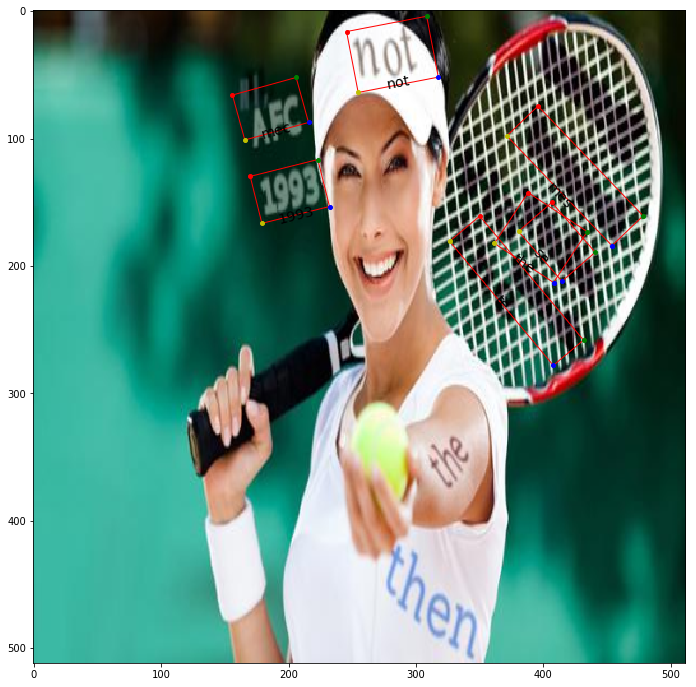

words (8, 256, 32, 1)
rboxes 8 words 8 res_crnn 8
make                 m_________a_____k_______e_____________________________________
end                  e__________n________d_________________________________________
any                  a____nn____y__________________________________________________
(16                  (_1__6________________________________________________________
send                 s___e___n___d_________________________________________________
now                  n__________o______w___________________________________________
EGA                  E______G_____A________________________________________________
Pdox                 P________d_______o______x_____________________________________


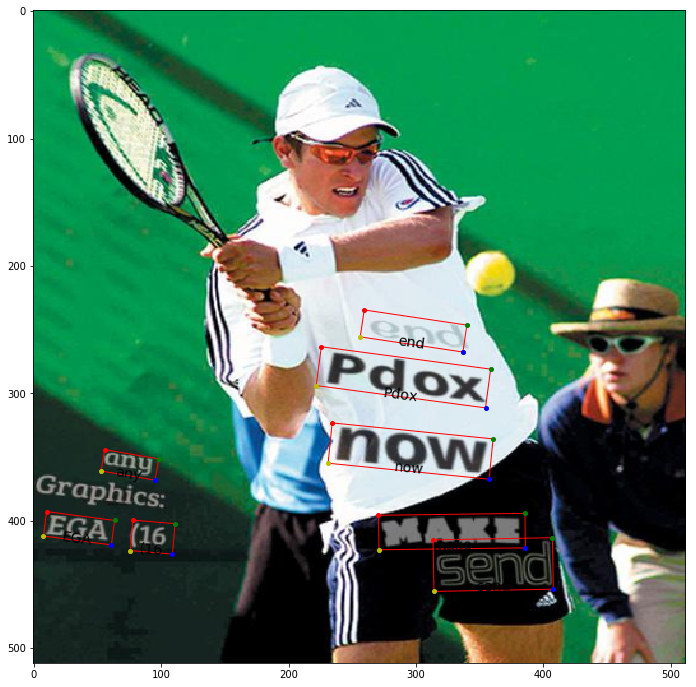

words (4, 256, 32, 1)
rboxes 4 words 4 res_crnn 4
back.                b____a____c___k______________________________________________.
Tom                  T__o__m_______________________________________________________
>you                 >_______y______o_____u________________________________________
Yup!                 Y________u____p____!__________________________________________


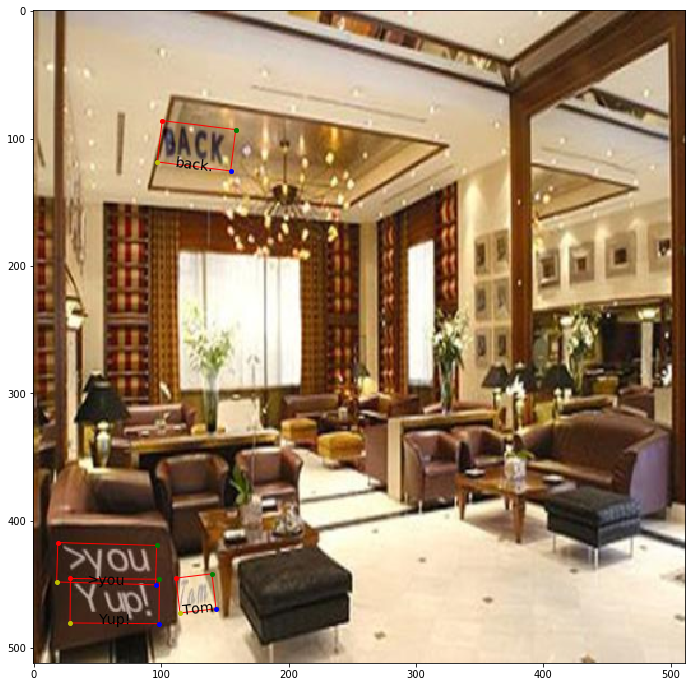

words (6, 256, 32, 1)
rboxes 6 words 6 res_crnn 6
the                  t_____________h_________e_____________________________________
Ray                  R____a____y___________________________________________________
you                  y____o__u_____________________________________________________
but                  b___________u______t__________________________________________
geantd               g________e_____a_____n____t___d_______________________________
as                   a_______s_____________________________________________________


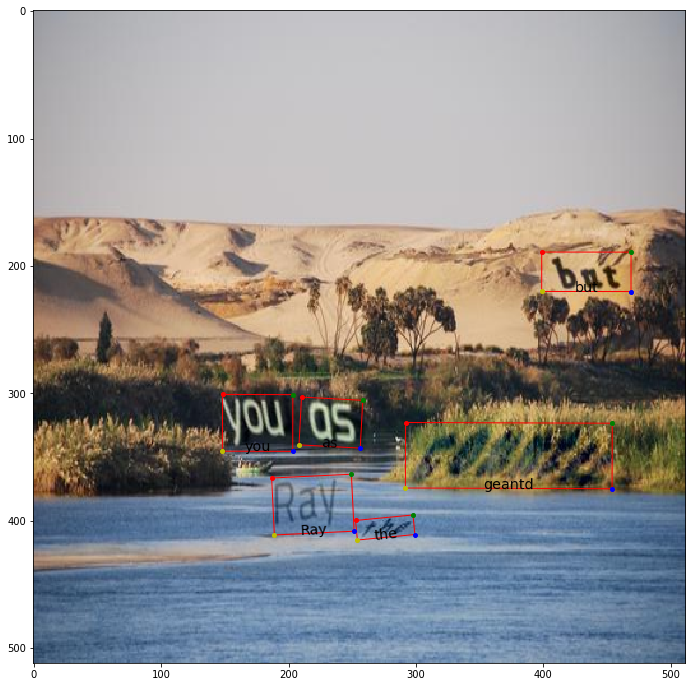

words (11, 256, 32, 1)
rboxes 11 words 11 res_crnn 11
was                  w____________________a___________s____________________________
Western.             W_________e___s___t___e___r___n______________________________.
they                 tt___h____e____y______________________________________________
ve                   v__________________e__________________________________________
some                 s____o___m______e_____________________________________________
very                 v_________e__________r___________yy___________________________
but                  b_________u_______t___________________________________________
been                 b___e__e__n___________________________________________________
fores                f_o_r__e__s___________________________________________________
for                  f___o___r_____________________________________________________
per                  pp_______e_____r______________________________________________


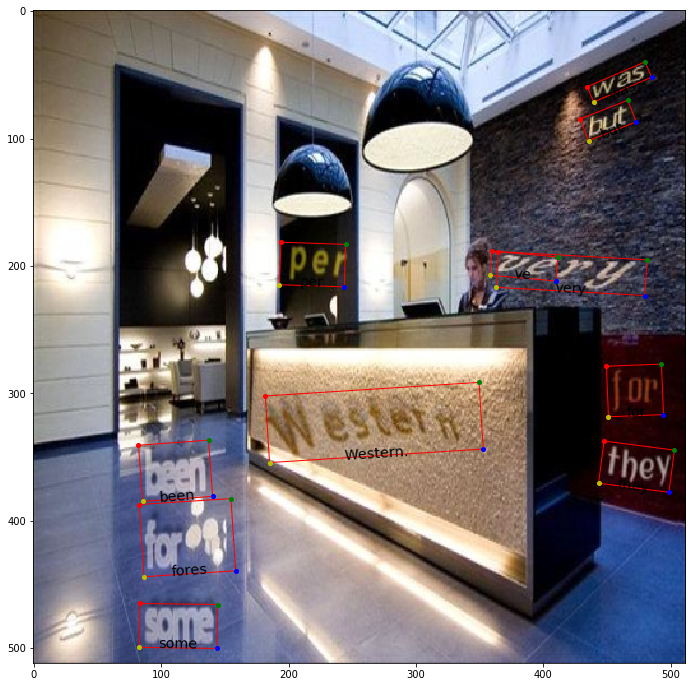

words (3, 256, 32, 1)
rboxes 3 words 3 res_crnn 3
and                  a__________n______d___________________________________________
>Fred                >________F_______rr____e__________d___________________________
X/y                  X__________/____y_____________________________________________


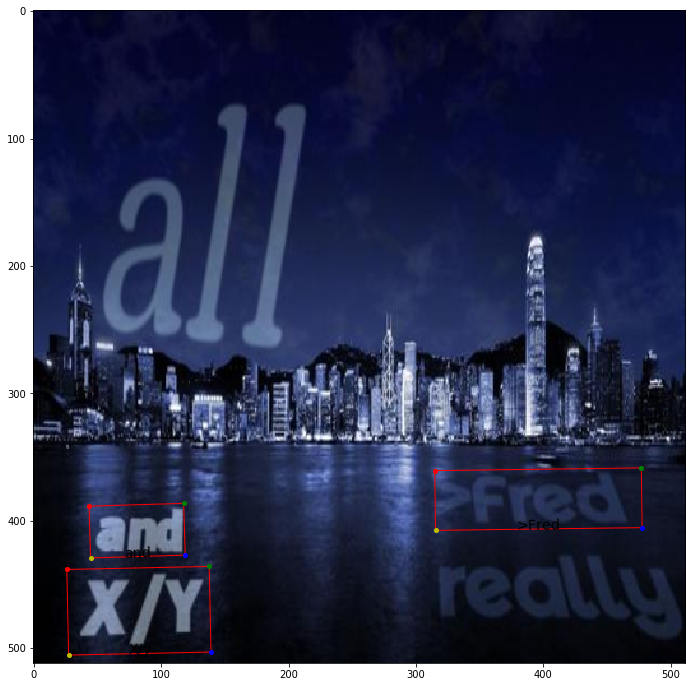

words (5, 256, 32, 1)
rboxes 5 words 5 res_crnn 5
This                 T____h_____ii__s______________________________________________
think                t__h__i__n__kk________________________________________________
block                bb_______l__o____c_____k______________________________________
rule                 r________u____l____e__________________________________________
Black                B_______l_____a____c____k_____________________________________


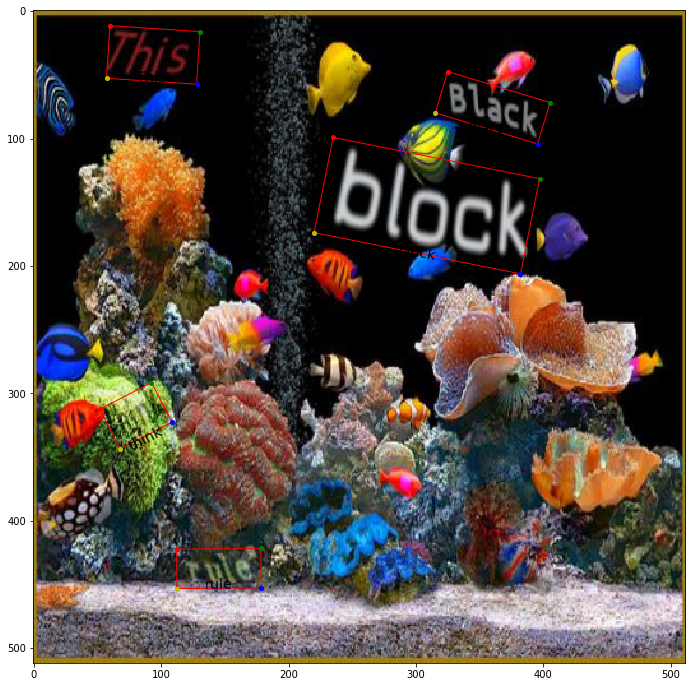

words (5, 256, 32, 1)
rboxes 5 words 5 res_crnn 5
agree                a____g___r___e___e____________________________________________
the                  tt___h___e____________________________________________________
L8s                  L_____________8_________s_____________________________________
poor                 p________o____o_____r_________________________________________
the                  t___________h_______e_________________________________________


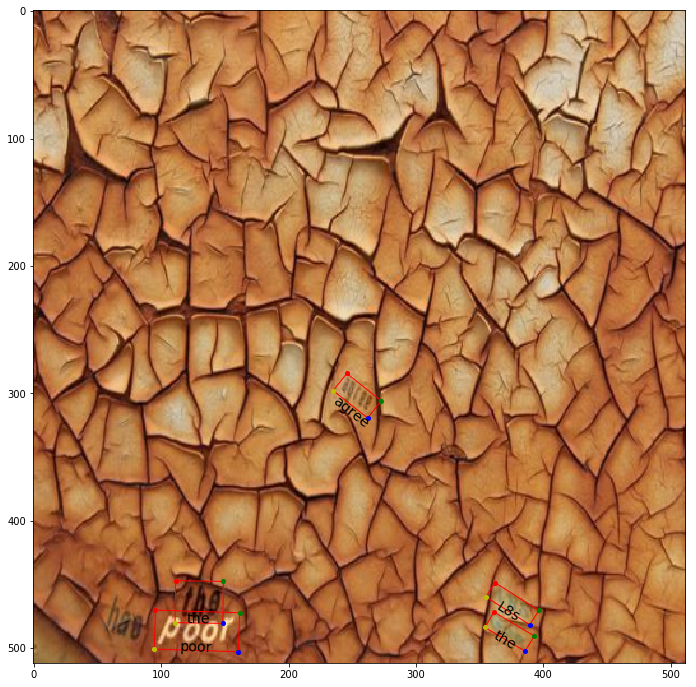

words (2, 256, 32, 1)
rboxes 2 words 2 res_crnn 2
drd                  d________r____d_______________________________________________
not                  n_____o____t__________________________________________________


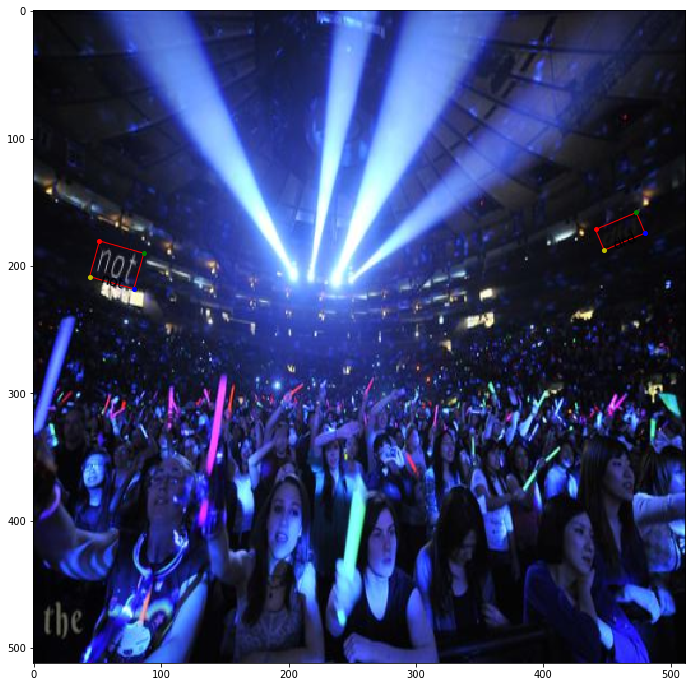

In [39]:
from crnn_data import crop_words
from crnn_utils import decode
from sl_utils import rbox_to_polygon, polygon_to_rbox
from ssd_viz import plot_box

experiment = '201710242216_sl512_synthtext'

#for fl in glob.glob('checkpoints/%s/result_*' % (experiment,)):
#    os.remove(fl)

# TODO:
#    train crnn with subtracted mean

for k in range(len(preds)):
    #if k != 2: continue
    plt.figure(figsize=[12]*2)
    plt.imshow(images[k])
    res = prior_util.decode(preds[k], segment_threshold=0.55, link_threshold=0.35)
    #prior_util.plot_results(res)
    #plt.savefig('checkpoints/%s/result_%03d.jpg' % (experiment, i))
    
    img = images_orig[k]
    #mean = np.array([104,117,123])
    #img -= mean[np.newaxis, np.newaxis, :]
    rboxes = res
    if len(rboxes) == 0:
        plt.show()
        continue
        
    bh = rboxes[:,3]
    rboxes[:,2] += bh * 0.2
    rboxes[:,3] += bh * 0.2
    boxes = np.asarray([rbox_to_polygon(r) for r in rboxes])
    boxes = np.flip(boxes, axis=1) # TODO: fix order of points, why?
    boxes = np.reshape(boxes, (-1, 8))
    
    boxes_mask_a = np.array([b[2] > b[3] for b in rboxes]) # width > height, in square world
    boxes_mask_b = np.array([not (np.any(b < 0) or np.any(b > 512)) for b in boxes]) # box inside image
    boxes_mask = np.logical_and(boxes_mask_a, boxes_mask_b)
    
    boxes = boxes[boxes_mask]
    rboxes = rboxes[boxes_mask]
    if len(boxes) == 0:
        boxes = np.empty((0,8))
    
    # plot boxes
    for box in boxes:
        c = 'rgby'
        for i in range(4):
            x, y = box[i*2:i*2+2]
            plt.plot(x,y, c[i], marker='o', markersize=4)
        plot_box(box, 'polygon')
    
    words = crop_words(img, boxes/512, input_height, width=input_width, grayscale=True)
    words = np.asarray([w.transpose(1,0,2) for w in words])
    print('words', words.shape)
    if len(words) > 0:
        res_crnn = crnn_model.predict(words)
    else:
        res_crnn = []

    print('rboxes', len(rboxes), 'words', len(words), 'res_crnn', len(res_crnn))
    for i in range(len(res_crnn)):
        chars = [alphabet[c] for c in np.argmax(res_crnn[i], axis=1)]
        
        if False:
            img = words[i][:,:,0].T
            plt.figure(figsize=[30,0.5])
            plt.imshow(img, cmap='gray')
            ax = plt.gca()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            plt.show()
        
        #gt_str = texts[i]
        res_str = decode(chars)
        
        #ed = editdistance.eval(gt_str, res_str)
        #ed = levenshtein(gt_str, res_str)
        #ed_norm = ed / len(gt_str)
        #mean_ed += ed
        #mean_ed_norm += ed_norm
        
        print('%-20s %s' % (res_str, ''.join(chars)))
        #print('%-20s %-20s %s %0.2f' % (
        #    gt_str,
        #    res_str,
        #    ''.join(chars),
        #    ed_norm))
        x, y, w, h, theta = rboxes[i]
        plt.text(x+h*np.sin(theta)/2, y+h*np.cos(theta)/2, res_str, rotation=theta/np.pi*180, 
                 horizontalalignment='center', size='x-large' , color='k') # 'magenta'
        
    plt.show()

In [30]:
#from ssd_utils import calc_memory_usage

calc_memory_usage(model)
calc_memory_usage(crnn_model)

model memory usage 1.50 GB
model memory usage 38.17 MB
